In [ ]:
# ALL IMPORTS

import json
import os
from collections import defaultdict

from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as transforms
import torch

import matplotlib.pyplot as plt
import numpy as np

import cv2

In [ ]:
# mount our Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# unzip images in Google Drive

!unzip '/content/drive/MyDrive/Colab Notebooks/APS360/Project/chessred2k.zip' -d '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K'

Archive:  /content/drive/MyDrive/Colab Notebooks/APS360/Project/chessred2k.zip
   creating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/
   creating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/
  inflating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG000.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG001.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG002.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG003.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG004.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG005.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG006.jpg  
  inflating:

In [ ]:
data_dir = '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K'
annotation_dir = '/content/drive/MyDrive/Colab Notebooks/APS360/Project/annotations.json'

with open(annotation_dir, "r") as f:
            annotations = json.load(f)

In [ ]:
# messing around with annotations.json

print(annotations.keys(), "\n")
print(annotations['categories'], "\n") # id map for each type of piece

print(annotations['splits']['chessred2k']['train'])
print(annotations['splits']['chessred2k']['val'])
print(annotations['splits']['chessred2k']['test'])

print(annotations['annotations']['pieces'][0]) # all 223,804 piece annotations for 10800 images
print(annotations['annotations']['corners'][0])

print(annotations['images'][0])

dict_keys(['info', 'images', 'annotations', 'categories', 'splits']) 

[{'id': 0, 'name': 'white-pawn'}, {'id': 1, 'name': 'white-rook'}, {'id': 2, 'name': 'white-knight'}, {'id': 3, 'name': 'white-bishop'}, {'id': 4, 'name': 'white-queen'}, {'id': 5, 'name': 'white-king'}, {'id': 6, 'name': 'black-pawn'}, {'id': 7, 'name': 'black-rook'}, {'id': 8, 'name': 'black-knight'}, {'id': 9, 'name': 'black-bishop'}, {'id': 10, 'name': 'black-queen'}, {'id': 11, 'name': 'black-king'}, {'id': 12, 'name': 'empty'}] 

{'image_ids': [2383, 2384, 2385, 2386, 2387, 2388, 2389, 2390, 2391, 2392, 2393, 2394, 2395, 2396, 2397, 2398, 2399, 2400, 2401, 2402, 2403, 2404, 2405, 2406, 2407, 2408, 2409, 2410, 2411, 2412, 2413, 2414, 2415, 2416, 2417, 2418, 2419, 2420, 2421, 2422, 2423, 2424, 2425, 2426, 2427, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2435, 2436, 2437, 2438, 2439, 2440, 2441, 2442, 2443, 2444, 2445, 2446, 2447, 2448, 2449, 2450, 2451, 2452, 2453, 2454, 2455, 2456, 2457, 2458, 2459, 2460, 2461, 

In [ ]:
image_id_to_path = {img['id']: os.path.join(data_dir, img['path']) for img in annotations['images']}
print(image_id_to_path)

image_to_pieces = defaultdict(list)
for ann in annotations['annotations']['pieces']:
    image_to_pieces[ann['image_id']].append(ann)
print(image_to_pieces[0])

{0: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG000.jpg', 1: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG001.jpg', 2: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG002.jpg', 3: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG003.jpg', 4: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG004.jpg', 5: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG005.jpg', 6: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG006.jpg', 7: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG007.jpg', 8: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG008.jpg', 9: '/content/drive/MyDrive/Colab Notebooks/APS360/Project/ChessReD2K/images/0/G000_IMG009.jpg', 10: '/content/drive/MyDrive/Colab Noteb

In [ ]:
# uppercase is white, lowercase is black
id_to_piece = {
    0: 'P', 1: 'R', 2: 'N', 3: 'B', 4: 'Q', 5: 'K',
    6: 'p', 7: 'r', 8: 'n', 9: 'b', 10: 'q', 11: 'k',
    12: '1'  # empty
}

piece_to_label = {
    'P': 0, 'R': 1, 'N': 2, 'B': 3, 'Q': 4, 'K': 5,
    'p': 6, 'r': 7, 'n': 8, 'b': 9, 'q': 10, 'k': 11
}

def fen_to_label_vector(fen):
    squares = []
    for row in fen.split('/'):
        for ch in row:
            if ch.isdigit():
                # squares.extend([12] * int(ch))  # 12 = empty
                squares.append(12)
            else:
                squares.append(piece_to_label[ch])
    return torch.tensor(squares, dtype=torch.long)  # shape: (64,)

# convert image piece list to FEN
def pieces_to_fen(piece_list):
    board = [['1'] * 8 for _ in range(8)]
    pos_to_index = lambda pos: (8 - int(pos[1]), ord(pos[0]) - ord('a'))

    for piece in piece_list:
        row, col = pos_to_index(piece['chessboard_position'])
        board[row][col] = id_to_piece[piece['category_id']]

    fen_rows = []
    for row in board:
        fen_row = ''
        count = 0
        for cell in row:
            if cell == '1':
                fen_row += '0'
            else:
                fen_row += cell
        fen_rows.append(fen_row)

    return '/'.join(fen_rows)

print(pieces_to_fen(image_to_pieces[10]))
print(fen_to_label_vector(pieces_to_fen(image_to_pieces[10])))
print(fen_to_label_vector(pieces_to_fen(image_to_pieces[10])).shape)

r00qkb0r/pppn0ppp/0000pn00/000p0b00/0P000000/P000PN00/0BPP0PPP/RN0QKB0R
tensor([ 7, 12, 12, 10, 11,  9, 12,  7,  6,  6,  6,  8, 12,  6,  6,  6, 12, 12,
        12, 12,  6,  8, 12, 12, 12, 12, 12,  6, 12,  9, 12, 12, 12,  0, 12, 12,
        12, 12, 12, 12,  0, 12, 12, 12,  0,  2, 12, 12, 12,  3,  0,  0, 12,  0,
         0,  0,  1,  2, 12,  4,  5,  3, 12,  1])
torch.Size([64])


In [ ]:
data_transform = transforms.Compose([
      transforms.Resize((224,224)),
      transforms.ToTensor(),
      ])


# dataset class to be used by DataLoader. Needs init, len, getitem functions
class ChessFENDataset(Dataset):
    def __init__(self, image_ids, image_to_pieces, image_id_to_path, transform=None):
        self.image_ids = image_ids
        self.image_to_pieces = image_to_pieces
        self.image_id_to_path = image_id_to_path
        self.transform = transform or transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_path = self.image_id_to_path[image_id]
        image = Image.open(image_path).convert("RGB")
        image = self.transform(image)

        piece_list = self.image_to_pieces[image_id]
        fen = pieces_to_fen(piece_list)
        label = fen_to_label_vector(fen)
        return image, label


In [ ]:
train_ids = annotations['splits']['chessred2k']['train']['image_ids']
train_dataset = ChessFENDataset(train_ids, image_to_pieces, image_id_to_path)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

print(f"ChessReD2K Training Images: {len(train_dataset)}")

val_ids = annotations['splits']['chessred2k']['val']['image_ids']
val_dataset = ChessFENDataset(val_ids, image_to_pieces, image_id_to_path)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)

print(f"ChessReD2K Validation Images: {len(val_dataset)}")

test_ids = annotations['splits']['chessred2k']['test']['image_ids']
test_dataset = ChessFENDataset(test_ids, image_to_pieces, image_id_to_path)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=True)

print(f"ChessReD2K Testing Images: {len(test_dataset)}")


ChessReD2K Training Images: 1442
ChessReD2K Validation Images: 330
ChessReD2K Testing Images: 306


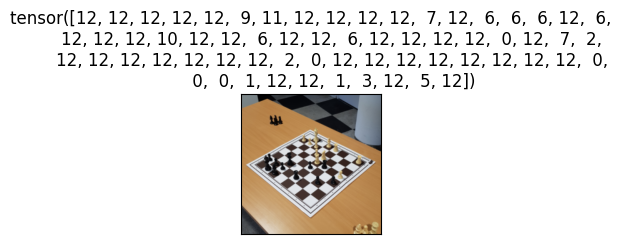

In [ ]:
# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = next(dataiter)
images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(1):
    ax = fig.add_subplot(2, int(20/2), idx+1, xticks=[], yticks=[])
    img = images[idx]
    plt.imshow(np.transpose(img, (1, 2, 0)))
    plt.title(labels[idx])

Original:


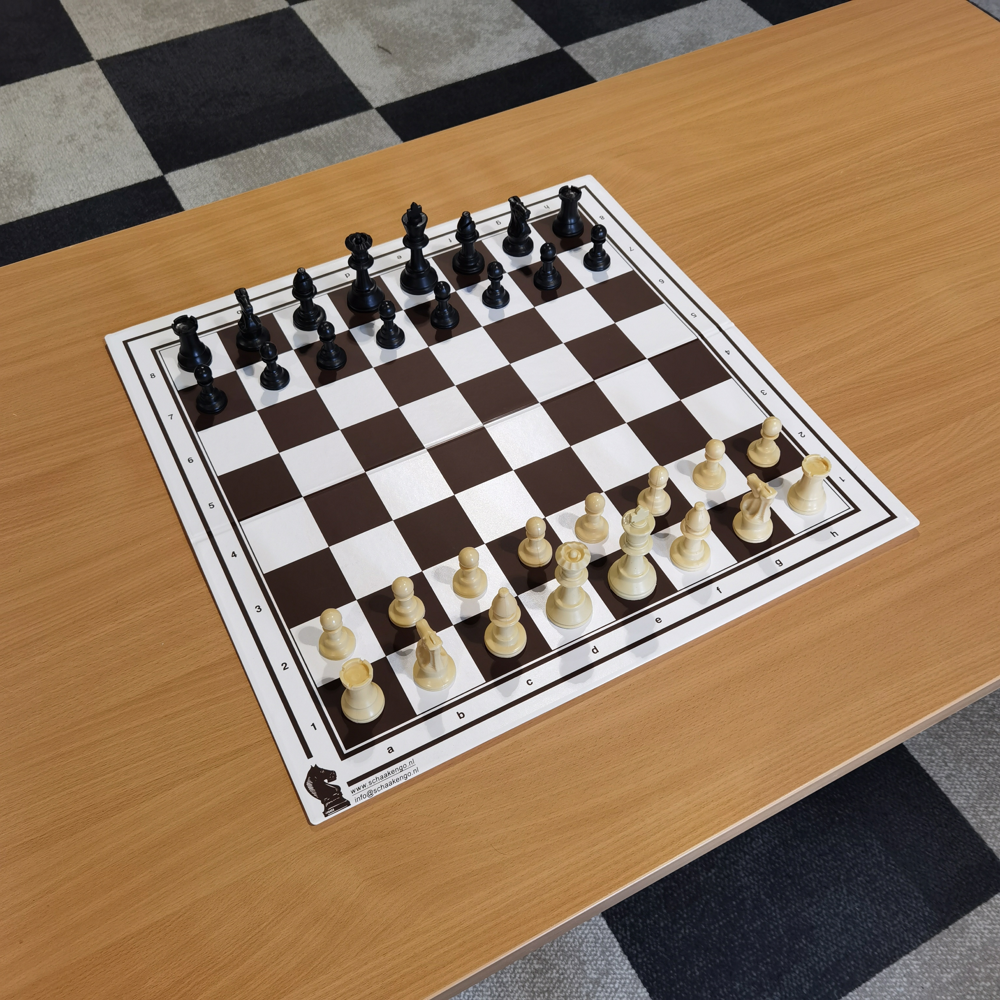

Edges:


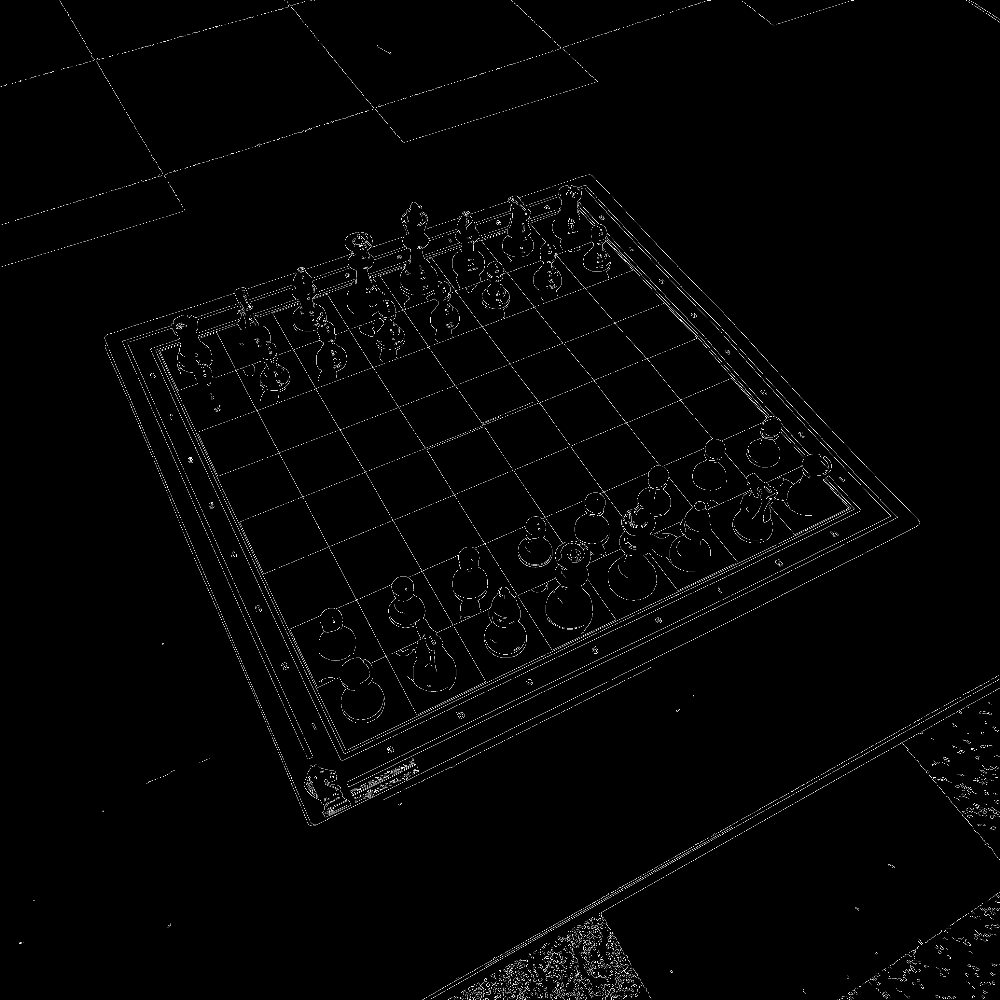

Warped board (top-down view):


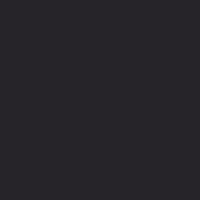

Number of squares: 64


In [109]:
# HOUGH LINE AND PROJECTIVE TRANSFORMS
from google.colab.patches import cv2_imshow

def preprocess_chessboard(image_path, output_size=200, display=True):
    """
    Preprocess a chessboard image:
    - Detect the board
    - Apply projective transform (top-down view)
    - Slice into 64 squares

    Args:
        image_path (str): Path to image.
        output_size (int): Size of output warped image (output_size x output_size).
        display (bool): Whether to display images using cv2_imshow.

    Returns:
        warped (np.array): Warped board image (top-down aligned)
        squares (list): List of 64 square images
    """
    img = cv2.imread(image_path)
    original = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blur, 50, 150)

    # Find contours and keep the largest
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)

    for cnt in contours:
        epsilon = 0.02 * cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, epsilon, True)
        if len(approx) == 4:
            board_corners = np.float32([pt[0] for pt in approx])
            break
    else:
        raise ValueError("Could not find a rectangular board contour.")

    # Order the corners: top-left, top-right, bottom-right, bottom-left
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]     # top-left
        rect[2] = pts[np.argmax(s)]     # bottom-right
        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]  # top-right
        rect[3] = pts[np.argmax(diff)]  # bottom-left
        return rect

    src_pts = order_points(board_corners)
    dst_pts = np.array([[0, 0], [output_size-1, 0],
                        [output_size-1, output_size-1], [0, output_size-1]], dtype="float32")

    # Compute perspective transform
    M = cv2.getPerspectiveTransform(src_pts, dst_pts)
    warped = cv2.warpPerspective(original, M, (output_size, output_size))

    # Display results
    if display:
        print("Original:")
        cv2_imshow(original)
        print("Edges:")
        cv2_imshow(edges)
        print("Warped board (top-down view):")
        cv2_imshow(warped)

    # Slice 64 squares
    squares = []
    square_size = output_size // 8
    for row in range(8):
        for col in range(8):
            x1 = col * square_size
            y1 = row * square_size
            square = warped[y1:y1 + square_size, x1:x1 + square_size]
            squares.append(square)

    return warped, squares

warped_board, square_imgs = preprocess_chessboard(image_id_to_path[0])
print(f"Number of squares: {len(square_imgs)}")
cv2_imshow(square_imgs[0])  # display top-left square (a8)